In [3]:

import sys

sys.path.append("../birdsong")

from urllib.request import urlretrieve, urlcleanup
import librosa
import IPython.display as ipd
import numpy as np
from data_management.utils.signal_extraction import normalized_stft, median_mask, morphological_filter, indicator_vector

In [4]:
url = 'https://www.xeno-canto.org/461383/download'
url = 'https://www.xeno-canto.org/sounds/uploaded/RFGQDPLDEC/XC433587-L%C3%B8vsanger%20XC%20H%C3%B8sbj%C3%B8r%20Elias%20A.%20Ryberg20180526081852_265.mp3'

def load_tmp(url):
    temp_file = urlretrieve(url)[0]
    audio, sr = librosa.load(temp_file, sr = 22050, mono=True)
    return audio, sr

In [5]:
audio, sr = load_tmp(url)

In [6]:
# Extraction
stft = normalized_stft(audio)
mask = median_mask(stft, 3)
morph = morphological_filter(mask)
vec = indicator_vector(morph)
ratio = audio.shape[0] / vec.shape[1]
vec_stretched = np.repeat(vec, ratio).astype(bool)

signal = audio[np.where(vec_stretched)[0]]
noise = audio[np.where(~vec_stretched)[0]]

## Original Audio:

In [83]:
ipd.Audio(audio, rate=sr) 

## Signal:

In [85]:
ipd.Audio(signal, rate=sr) 

## Noise:

In [87]:
ipd.Audio(noise, rate=sr) 

In [7]:
import librosa.display
import matplotlib.pyplot as plt

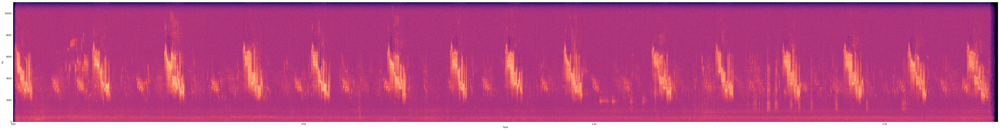

In [11]:
power_stft = librosa.power_to_db(stft)
plt.figure(figsize=(80,10))
librosa.display.specshow(power_stft, x_axis='time', y_axis='hz', cmap='magma')
plt.savefig('Spec.png')

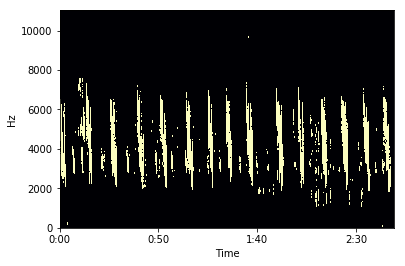

In [12]:
librosa.display.specshow(morph, x_axis='time', y_axis='hz')
plt.savefig('Mask.png')

In [13]:
morph.shape

(1025, 7299)

In [14]:
vec_mask = np.repeat(vec, 1025, axis=0)
vec_mask.shape

(1025, 7299)

In [15]:
signal_mask = np.where(vec_mask, power_stft, np.nan)
noise_mask = np.where(vec_mask, np.nan, power_stft)

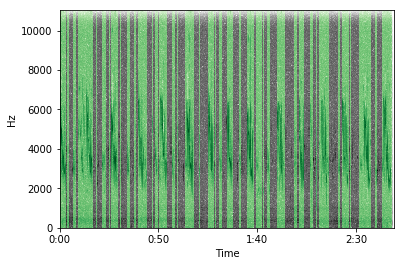

In [16]:
librosa.display.specshow(signal_mask, x_axis='time', y_axis='hz', cmap='Greens')
librosa.display.specshow(noise_mask, x_axis='time', y_axis='hz', cmap='Greys')
plt.savefig('Separated.png')

In [17]:
signal_stft =  librosa.power_to_db(normalized_stft(signal))
noise_stft =  librosa.power_to_db(normalized_stft(noise))


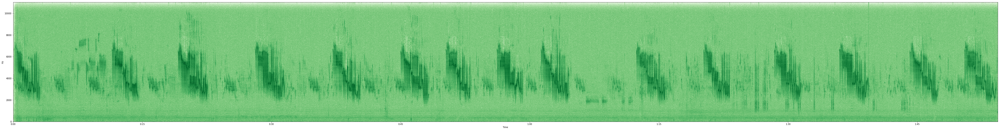

In [18]:
plt.figure(figsize=(80,10))
librosa.display.specshow(signal_stft, x_axis='time', y_axis='hz', cmap='Greens')
plt.savefig('Signal_only.png')

In [117]:
x = np.zeros((power_stft.shape[0], power_stft.shape[1] - signal_stft.shape[1]))#.fill(np.nan)
x.fill(np.nan)
signal_stft = np.hstack([signal_stft, x])

In [119]:
x = np.zeros((power_stft.shape[0], power_stft.shape[1] - noise_stft.shape[1]))#.fill(np.nan)
x.fill(np.nan)
noise_stft = np.hstack([x, noise_stft])

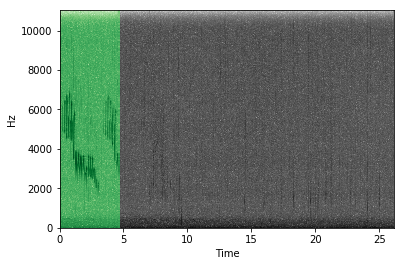

In [122]:


librosa.display.specshow(noise_stft, x_axis='time', y_axis='hz', cmap='Greys')
librosa.display.specshow(signal_stft, x_axis='time', y_axis='hz', cmap='Greens')
plt.savefig('Separated2.png')

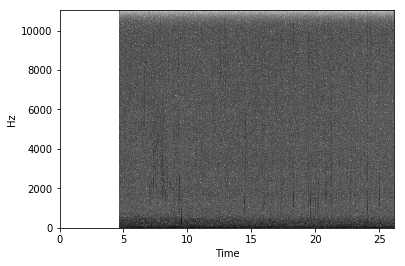

In [120]:
librosa.display.specshow(noise_stft, x_axis='time', y_axis='hz', cmap='Greys')
